## Madmom (ran with the madmom mamba env)

RNNBeatProcessor = Pipeline applying (B)LSTM to varying-length STFTs

TCNBeatProcessor = Pipeline applying Temporal Convolutional Networks

what do these 2 return?

||
\\/

DBNBeatTrackingProcessor / CRFBeatDetectionProcessor




In [1]:
%matplotlib inline

import madmom
import numpy as np
from pathlib import Path
from librosa import clicks
import matplotlib.pyplot as plt
from IPython.display import Audio

In [42]:
N = 95
songPath = Path(f"~/Documents/theSalsaProject/audioFragments/{N}.wav").expanduser()
sig = madmom.audio.signal.Signal(data = songPath)
sig

Signal([  -1,    2,   -3, ..., -770, -876, -814], dtype=int16)

In [43]:
Audio(sig.T, rate = sig.sample_rate)

In [47]:
rnn = madmom.features.beats.RNNBeatProcessor()
btp = madmom.features.beats.DBNBeatTrackingProcessor(fps = 100)
res = rnn(sig) 
oddBeats = btp(res)

In [48]:
evenBeats = (oddBeats[:-1] + oddBeats[1:]) / 2
# evenBeats = np.append(evenBeats, 2 * evenBeats[-1] - evenBeats[-2])

# beats = np.zeros((evenBeats.shape[0] + oddBeats.shape[0], ))
# beats[ ::2] = oddBeats
# beats[1::2] = evenBeats

In [13]:
def removeEveryNth(arr: np.array, n: int = 4):
    return np.delete(arr, np.arange(0, arr.size, n))

In [ ]:
# sounds = clicks(times = removeEveryNth(beats[::2]), sr = sig.sample_rate)
sounds = clicks(times = removeEveryNth(evenBeats), sr = sig.sample_rate)
if sounds.shape[0] > sig.shape[0]:
    sounds = sounds[:sig.shape[0]]
else:
    sounds = np.pad(sounds, (0, sig.shape[0] - sounds.shape[0]), 'constant', constant_values = 0)

Audio(15000 * sounds + sig.T, rate = sig.sample_rate)

In [21]:
secondsToMins = np.vectorize(lambda t: f"{round(t) // 60}:{round(t) % 60}")

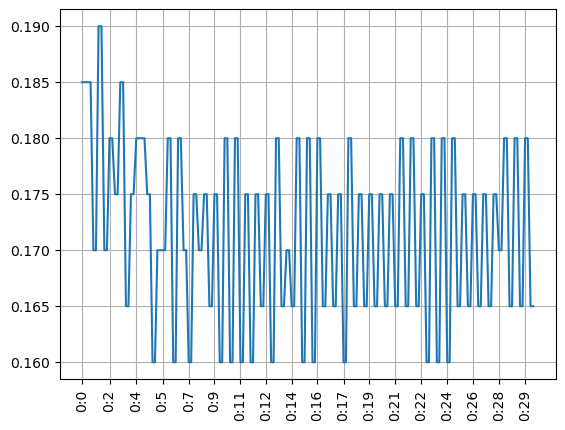

In [22]:
n = 10

plt.plot(beats[:-1], beats[1:] - beats[:-1])
plt.grid()

plt.xticks(beats[::n], secondsToMins(beats[::n]), rotation=90)
plt.show()

In [44]:
annotatedBeats = np.loadtxt(songPath.parent.parent / Path(f"beatAnnotations/{N}.txt")) / 1000
annotatedBeats = annotatedBeats[annotatedBeats < 30]

In [51]:
oddBeats[oddBeats> 11]

array([11.25, 12.02, 12.85, 13.6 , 14.43, 15.13, 15.83, 16.5 , 17.18,
       17.84, 18.5 , 19.16, 19.82, 20.49, 21.16, 21.84, 22.49, 23.14,
       23.82, 24.48, 25.14, 25.79, 26.49, 27.16, 27.83, 28.5 , 29.17,
       29.83])

In [53]:
evenBeats[evenBeats > 11]

array([11.635, 12.435, 13.225, 14.015, 14.78 , 15.48 , 16.165, 16.84 ,
       17.51 , 18.17 , 18.83 , 19.49 , 20.155, 20.825, 21.5  , 22.165,
       22.815, 23.48 , 24.15 , 24.81 , 25.465, 26.14 , 26.825, 27.495,
       28.165, 28.835, 29.5  ])

In [45]:
annotatedBeats

array([11.257, 11.947, 12.685, 13.373, 14.061, 14.763, 15.479, 16.166,
       16.855, 17.558, 18.218, 18.843, 19.525, 20.205, 20.854, 21.541,
       22.203, 22.875, 23.513, 24.181, 24.831, 25.531, 26.169, 26.854,
       27.518, 28.207, 28.83 , 29.491])

In [56]:
# sounds = clicks(times = removeEveryNth(beats[::2]), sr = sig.sample_rate)
sounds = clicks(times = oddBeats, sr = sig.sample_rate)
if sounds.shape[0] > sig.shape[0]:
    sounds = sounds[:sig.shape[0]]
else:
    sounds = np.pad(sounds, (0, sig.shape[0] - sounds.shape[0]), 'constant', constant_values = 0)

Audio(15000 * sounds + sig.T, rate = sig.sample_rate)